# Are you on PC or MAC? pc = 0, mac = 1

In [2]:
computer = 0
#! source activate tensorflow

# I) Libraries

In [3]:
%matplotlib inline

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.dates as md
import numpy as np
import pandas_datareader.data as web
import datetime
import pandas as pd
import os
import csv
import glob as glob
import tensorflow as tf
from sklearn.preprocessing import MinMaxScaler
from time import time

matplotlib.rcParams[ 'figure.figsize' ] = ( 20, 6 )

# Which Data set would you like to use ? (503 pts -> data) / (671 pts -> Data_671_points)

In [4]:
ROOTPATH = os.getcwd()

data = 'Data_671_points'
path_data = os.path.join(ROOTPATH, data)
file = path_data+"/csv_IBB_from_2015-05-05_to_2018-01-01.csv"
data_variable = 0

#data = 'data'
#path_data = os.path.join(ROOTPATH, data)
#file = path_data+"/csv_IBB_from_2016-01-01_to_2018-01-01.csv"
#data_variable = 1

 # II) Import Data

In [6]:
# Comprehensive way to set the path to Data directory

path_data = os.path.join(ROOTPATH, data)
path_train = os.path.join(path_data, 'train_set')
path_test = os.path.join(path_data, 'test_set')
path_validation = os.path.join(path_data, 'validation_set')

## Import the list of tickers

In [7]:
if computer == 0:
    with open('IBB_holdings.csv', 'r') as csvfile:
        file = csv.reader(csvfile,delimiter=' ')
        c=0
        list_tickers=[]
        for row in file:
            if c>=11:
                list_tickers.append(row[0].split(',')[0])
            c+=1

if computer == 1:
    with open('IBB_holdings.csv', 'r', encoding ='mac_roman') as csvfile:
        file = csv.reader(csvfile,delimiter=' ')
        c=0
        list_tickers=[]
        for row in file:
            if c>=11:
                list_tickers.append(row[0].split(',')[0])
            c+=1            

list_tickers.sort()
list_tickers.pop()
list_tickers.remove("BLKFDS")
list_tickers.remove("USD")
list_tickers.remove("SNDX")

## Importing functions

In [8]:
def get_data(path):
    list_dataframes=[]
    allFiles = glob.glob(path + "/csv" + "*.csv")
    i = 0
    list_tickers = []
    
    if computer == 0:
        for file_ in allFiles:
            with open(file_, 'r') as csvfile:
                list_dataframes.append(pd.read_csv(csvfile, index_col=None, header=0))
                list_tickers.append(file_.split('_')[4])
                i+=1

    if computer == 1:
        for file_ in allFiles:
            with open(file_, 'r', encoding ='mac_roman') as csvfile:
                list_dataframes.append(pd.read_csv(csvfile, index_col=None, header=0))
                list_tickers.append(file_.split('_')[4])
                i += 1
    
    num_files = i
    
    return num_files, list_dataframes, list_tickers


# III) Functions

## Initializing functions

In [9]:
def weight_variable(num_input, num_output):
    weight_init = tf.random_normal_initializer(stddev=1.0/np.sqrt(num_input))
    weight_shape = [num_input, num_output]
    W = tf.get_variable('W', weight_shape, initializer = weight_init)
    return(W)

def bias_variable(num_output):
    bias_init = tf.constant_initializer(value = 0)
    bias_shape = [num_output]
    b = tf.get_variable('b', bias_shape, initializer = bias_init)
    return(b)

## Fetch data functions

In [10]:
def find_ticker_batch(batch, data_norm, list_tickers):
    true = batch
    index = -1
    i = 0
    while index < 0:
        if data_norm[i][100] - true[100] == 0:
            index = i
        i += 1
    ticker = list_tickers[index]
    return(ticker, index)

## Tensorflow functions

In [11]:
def variable_summary_light(var):
    with tf.variable_scope('summaries'):
        mean = tf.reduce_mean(var)
        tf.summary.scalar('mean', mean)
        with tf.name_scope('stddev'):
            stddev = tf.sqrt(tf.reduce_mean(tf.square(var - mean)))
        tf.summary.scalar('stddev', stddev)

In [12]:
def variable_summary(var):
    with tf.name_scope('summaries'):
        mean = tf.reduce_mean(var)
        tf.summary.scalar('mean', mean)
        with tf.name_scope('stddev'):
            stddev = tf.sqrt(tf.reduce_mean(tf.square(var - mean)))
        tf.summary.scalar('stddev', stddev)
        tf.summary.scalar('max', tf.reduce_max(var))
        tf.summary.scalar('min', tf.reduce_min(var))
        tf.summary.histogram('histogram', var)

In [13]:
def create_summaries(loss, x, latent, output):
    writer = tf.summary.FileWriter("./logs")
    tf.summary.scalar("Loss", loss)
    layer_grid_summary("Input", x, [28, 28])
    layer_grid_summary("Encoder", latent, [2, 1])
    layer_grid_summary("Output", output, [28, 28])
    return writer, tf.summary.merge_all()

In [14]:
def next_batch(batch_size, data, labels):
    '''
    Return a total of `num` random samples and labels. 
    '''
    idx = np.arange(0 , len(data))
    np.random.shuffle(idx)
    idx = idx[:batch_size]
    data_shuffle = [data[i] for i in idx]
    labels_shuffle = [labels[i] for i in idx]

    return np.array(data_shuffle), np.array(labels_shuffle)

In [15]:
def next_fold(i, cross_len):
    
    n = len(cross_setData_n)
    if cross_len > 1:
        test_len = int(n / cross_len)
        init = (i - 1) * test_len
        end = i * test_len

        test_setDn = cross_setData_n[init:end]
        train_setDn = np.concatenate((cross_setData_n[0:init] ,cross_setData_n[end:n]),axis = 0)

        list_tickers_cross_test = list_tickers_cross[init:end]
        list_tickers_cross_train = np.concatenate((list_tickers_cross[0:init] ,list_tickers_cross[end:n]),axis = 0)

        test_setD = cross_setData[init:end]
        train_setD = np.concatenate((cross_setData[0:init] ,cross_setData[end:n]),axis = 0)
    else:
        train_setDn = train_setData_n
        test_setDn = test_setData_n
        list_tickers_cross_train = list_tickers_train
        list_tickers_cross_test = list_tickers_test
        train_setD = train_setData
        test_setD = test_setData
        
    return train_setDn, test_setDn, list_tickers_cross_train, list_tickers_cross_test, train_setD, test_setD

In [16]:
def layer_batch_normalization(x, n_out, phase_train):

    beta_init = tf.constant_initializer(value=0.0, dtype=tf.float32)
    beta = tf.get_variable("beta", [n_out], initializer=beta_init)
    
    gamma_init = tf.constant_initializer(value=1.0, dtype=tf.float32)
    gamma = tf.get_variable("gamma", [n_out], initializer=gamma_init)

    batch_mean, batch_var = tf.nn.moments(x, [0], name='moments')
    
    ema = tf.train.ExponentialMovingAverage(decay=0.9)
    ema_apply_op = ema.apply([batch_mean, batch_var])
    ema_mean, ema_var = ema.average(batch_mean), ema.average(batch_var)
    
    def mean_var_with_update():
        with tf.control_dependencies([ema_apply_op]):
            return tf.identity(batch_mean), tf.identity(batch_var)
        
    mean, var = tf.cond(phase_train, mean_var_with_update, lambda: (ema_mean, ema_var))

    reshaped_x = tf.reshape(x, [-1, 1, 1, n_out])
    normed = tf.nn.batch_norm_with_global_normalization(reshaped_x, mean, var, beta, gamma, 1e-3, True)
    
    return tf.reshape(normed, [-1, n_out])

In [17]:
def layer(input_tensor, num_input, num_output, phase_train, layer_name, bool_drop):
    with tf.variable_scope(layer_name):
        with tf.variable_scope('weights'):
            W = weight_variable(num_input, num_output)
            variable_summary_light(W)
    
        with tf.variable_scope('biases'):
            b = bias_variable(num_output)
            variable_summary_light(W)
            
        
        if bool_drop:
            dropped_or_not = dropout(input_tensor, keep_prob)
        else:
            dropped_or_not = input_tensor
            
        logits = tf.matmul(dropped_or_not, W) + b
            
    return tf.nn.relu(layer_batch_normalization(logits, num_output, phase_train)), W

In [18]:
def encoder(input_tensor, n_code, phase_train):
    with tf.variable_scope("encode"):
        
        with tf.variable_scope('h_1'):
            h_1, W_e_1 = layer(input_tensor, num_input, num_encode_1, phase_train, "encoder", False)
            
        with tf.variable_scope('output'):
            output, W_e_2 = layer(h_1, num_encode_1, n_code, phase_train, "encoder",True)
            
    return output, W_e_2

def decoder(input_tensor, n_code, phase_train):
    with tf.variable_scope("decode"):
        
        with tf.variable_scope('h_1'):
            h_1, W_d_1 = layer(input_tensor, n_code, num_decode_1, phase_train, "encoder",True)
        
        with tf.variable_scope('output'):
            output, W_d_2 = layer(h_1, num_decode_1, num_output, phase_train, "decoder",False)
            
    return output, W_d_2


In [19]:
def dropout(encoder_op, keep_prob):
    with tf.variable_scope("dropped"):
        dropped = tf.nn.dropout(encoder_op, keep_prob)
    return dropped

In [20]:
def mse(output, x):
    with tf.variable_scope('mse'):
        mse = tf.squared_difference(output, x)
    return mse

In [21]:
def regularizer(W_e, W_d):
    with tf.variable_scope("regularizer"):
        regularizer = tf.nn.l2_loss(W_e) + tf.nn.l2_loss(W_d)
    return regularizer

In [22]:
def loss(mse, regularizer, lambd, num_input, batch_size):
    with tf.variable_scope("loss"):
        loss = tf.reduce_sum(mse + lambd * regularizer)/(num_input * batch_size * 2)
    return loss

In [23]:
def training(loss, learning_rate):
    optimizer = tf.train.AdamOptimizer(learning_rate)
    train_op = optimizer.minimize(loss)
    return train_op

In [24]:
def evaluate(output, x):
    with tf.variable_scope('validation'):
        
        l2_norm = tf.sqrt(tf.reduce_sum(tf.square(tf.subtract(output, x, name="val_diff")), 1))
        
        val_loss = tf.reduce_mean(l2_norm)
        
        val_summary_op = tf.summary.scalar("val_cost", val_loss)
        
        return val_loss, val_summary_op

# Benchmark functions

In [25]:
def logRateOfReturnWeekly(df,shift):
    
    # Making sure dataframe is well sorted
    df_sorted = df.sort_index( ascending = True )
    

    #Be careful with the shift!
    df_shifted = df_sorted.shift(shift)
    log_rate_of_returns = np.log(df_sorted / df_shifted)
    for i in range(shift):
        log_rate_of_returns = log_rate_of_returns.drop(log_rate_of_returns.index[0])

    return log_rate_of_returns

In [26]:
def modify_benchmark(df,column,threshold,shift):
    rate = logRateOfReturnWeekly(df,shift)
    for i in range(len(rate[column])):
        if rate[column][i] <= - threshold:
            rate[column][i] = threshold
    return rate

In [27]:
def reconstruct(rates):
    prices = [1]
    for i in range(len(rates)):
        prices.append( (rates[i] + 1) * prices[i])
    return prices

# Be careful to use the good benchmark file

In [6]:
if data_variable == 0:
    file = path_data+"/csv_IBB_from_2015-05-05_to_2018-01-01.csv"

if data_variable == 1:
    file = path_data+"/csv_IBB_from_2016-01-01_to_2018-01-01.csv"

if computer == 0:
    with open(file, 'r') as csvfile:
        benchmark = pd.read_csv(csvfile, index_col=None, header=0)
        benchmark = benchmark.set_index(pd.DatetimeIndex(benchmark["Date"]))
        del benchmark["Date"]
        
if computer == 1:
    with open(file, 'r', encoding ='mac_roman') as csvfile:
        benchmark = pd.read_csv(csvfile, index_col=None, header=0)
        benchmark = benchmark.set_index(pd.DatetimeIndex(benchmark["Date"]))
        del benchmark["Date"]

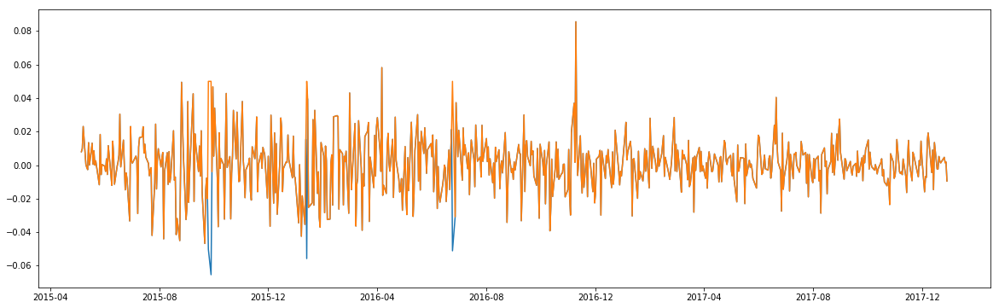

In [31]:
shift_calib = 1
threshold = 0.05

rate = logRateOfReturnWeekly(benchmark,shift_calib)
plt.plot(rate['Adj Close'])
plt.show;

rate2 = modify_benchmark(benchmark,'Adj Close',threshold,shift_calib)
plt.plot(rate2['Adj Close'])
plt.show;

## Calibration network functions

In [32]:
def layer1_calib(input_tensor, S, n_code, phase_train):
    with tf.variable_scope("calib"):
            
        with tf.variable_scope('output'):
            output, W_e = layer(input_tensor, S, n_code, phase_train, "encoder",True)
            
    return output, W_e

def layer2_calib(input_tensor, S, n_code, phase_train):
    with tf.variable_scope("decode"):
        
        with tf.variable_scope('output'):
            output, W_d = layer(input_tensor, n_code, S, phase_train, "decoder",False)
            
    return tf.nn.softmax(output), W_d

## Training functions

In [33]:
def next_batch_calib(batch_size, data, labels):
    '''
    Return a total of `num` random samples and labels. 
    '''
    idx = np.arange(0 , len(data))
    np.random.shuffle(idx)
    idx = idx[0]
    data_shuffle = data[idx]
    labels_shuffle = labels[idx]

    return np.array(data_shuffle), np.array(labels_shuffle)

In [34]:
def next_batch(batch_size, data, labels):
    '''
    Return a total of `num` random samples and labels. 
    '''
    idx = np.arange(0 , len(data))
    np.random.shuffle(idx)
    idx = idx[:batch_size]
    data_shuffle = [list(data[i]) for i in idx]
    labels_shuffle = [labels[i] for i in idx]

    return np.array(data_shuffle), np.array(labels_shuffle)

In [35]:
def normalize_data(num_files, list_dataframes, list_tickers):
    
    maxi = 0
    length = 0
    compt = 0
    j = 0
    
    for df in list_dataframes:
        if len(df) > maxi:
            maxi = len(df['Adj Close'])
    
    data = np.array([np.zeros(maxi)]*(num_files))
    data_normalized = np.array([np.zeros(maxi)]*(num_files))
    
    i = 0
    
    for df in list_dataframes:
        arr = np.array(df['Adj Close'])
        if len(arr) == maxi and not df['Adj Close'].isnull().values.any(): 
            data[j] = arr
            minimum = np.min(arr)
            maximum = np.max(arr)
            arr = (arr - minimum) / (maximum - minimum)
            data_normalized[j] = arr
            j += 1
        else:
            list_tickers.pop(i)
            compt += 1
            i-=1
        i += 1
    
    return data_normalized[:-compt], data[:-compt], list_tickers

# IV) Actual training

# 1) Gather data and split it into a train and a test

In [36]:
train_setDf = get_data(path_train)

validation_setDf = get_data(path_validation)

test_setDf = get_data(path_test)

all_dataset_dfn, all_dataset_df, all_dataset_ticker = normalize_data(train_setDf[0] + test_setDf[0]+validation_setDf[0], train_setDf[1] + test_setDf[1]+validation_setDf[1], train_setDf[2] + test_setDf[2]+validation_setDf[2])

In [37]:
def time_split_calib(list_to_split_n, list_to_split):
    # Will produce the 75% / 25% train and test data for the calibration phase
    index_rows = len(list_to_split)
    bound_train = int(np.floor(len(list_to_split)*0.75))
    index_train = bound_train
        
    train_dfn = list_to_split_n[:index_train]
    test_dfn = list_to_split_n[index_train:]
    
    train_df = list_to_split[:index_train]
    test_df = list_to_split[index_train:]

    return train_dfn, test_dfn, train_df, test_df

In [38]:
train_dfn = []
test_dfn = []
train_df = []
test_df = []

for i in range(len(all_dataset_dfn)):
    split_75_n, split_25_n, split_75, split_25 = time_split_calib(all_dataset_dfn[i], all_dataset_df[i])
    train_dfn.append(list(split_75_n))
    test_dfn.append(list(split_25_n))
    train_df.append(list(split_75))
    test_df.append(list(split_25))
    
train_dfn = np.array(train_dfn)
test_dfn = np.array(test_dfn)
train_df = np.array(train_df)
test_df = np.array(test_df)

# 2) Initialize the AE

In [39]:
# Training Parameters
learning_rate = 0.0004
num_steps = 2000
batch_size = 25
lambd = 0.12
val_dropout = 0.88

display_step = 100

# Network Parameters 

num_input = len(train_dfn[0]) # 503 days considered
num_encode_1 = 250 # 1st layer of encode
n_code = 5  # bottleneck layer
num_decode_1 = 250 # 1st layer of decode
num_output = len(train_dfn[0])


date = str(int(time()))

logs_path = '/tmp/tensorflow_logs/autoencoder1/'+date+'/'

# 3) Launch the training of the AE

In [ ]:
#def train_function(train_setDn, test_setDn):
with tf.Graph().as_default():
    with tf.variable_scope("autoencoder_model"):
        
        # Placeholders
        x = tf.placeholder("float", [None, num_input])
        phase_train = tf.placeholder(tf.bool)
        keep_prob = tf.placeholder(tf.float32) #gateway for dropout

        # Extract the latent information (logits from the bottleneck layer)
        code, W_e = encoder(x, n_code, phase_train)

        # Extract the outputs of the autoencoder
        output, W_d = decoder(code, n_code, phase_train)

        cost = loss(mse(output,x), regularizer(W_e, W_d), lambd, num_input, batch_size)

        train_op = training(cost, learning_rate)

        eval_op, val_summary_op = evaluate(output, x)

        # Merge all the summaries - variables, training - into a single operation
        summary_op = tf.summary.merge_all()

        # Save the trained model for later use (testing)
        saver = tf.train.Saver()        

        # Create the session list that will be runned for training
        total_loss = np.zeros(num_steps)

        start_time = time()
                    
        sess = tf.Session()

        # Initialize a summary for our variables during the training
        summary_writer = tf.summary.FileWriter(logs_path, graph=tf.get_default_graph())

        # Time to launch the session
        init_op = tf.global_variables_initializer()
        sess.run(init_op)

        for i in range(1, num_steps + 1):

            # Prepare Data
            total_batch = int(len(train_dfn) / batch_size)

            for j in range(total_batch):
                mini_batch_x, _ = next_batch(batch_size, train_dfn, train_dfn)

                _, l, summary = sess.run([train_op, cost, summary_op], 
                            feed_dict={x: mini_batch_x, phase_train: True, keep_prob: val_dropout})
            total_loss[i-1] = l

            # Write on the log file the datas for TensorBoard / First: summary, Second: overall step
            summary_writer.add_summary(summary, i)

            if i % display_step == 0:

                print('Step %i: Minibatch Loss: %f' % (i, l))
                curr_time = time()
                elapsed_time = curr_time-start_time
                print('Estimated remaining time = ', elapsed_time / i * (num_steps - i-1),'s\n')

        len_train = len(train_dfn)
        batch_x, _ = next_batch(len(train_dfn),train_dfn,train_dfn)
        l , p = sess.run([cost, output] , feed_dict={x: batch_x, phase_train: False, keep_prob: 1})
        l = l * batch_size / len_train
        print('Minibatch Loss: '+str(l)+'\n\n') 




Step 100: Minibatch Loss: 0.067952
Estimated remaining time =  293.86298144102096 s

Step 200: Minibatch Loss: 0.018997
Estimated remaining time =  223.91706547498703 s

Step 300: Minibatch Loss: 0.020434
Estimated remaining time =  184.7779971218109 s

Step 400: Minibatch Loss: 0.024668
Estimated remaining time =  163.12444582521917 s

Step 500: Minibatch Loss: 0.013961
Estimated remaining time =  145.0725405597687 s

Step 600: Minibatch Loss: 0.013708
Estimated remaining time =  133.50955779035885 s

Step 700: Minibatch Loss: 0.013823
Estimated remaining time =  122.66304416656494 s

Step 800: Minibatch Loss: 0.014778
Estimated remaining time =  110.81160196006299 s

Step 900: Minibatch Loss: 0.017911
Estimated remaining time =  99.42740148756239 s

Step 1000: Minibatch Loss: 0.013860
Estimated remaining time =  88.7151654138565 s

Step 1100: Minibatch Loss: 0.013150
Estimated remaining time =  79.05395091338592 s

Step 1200: Minibatch Loss: 0.013182
Estimated remaining time =  69.57

# 4) Prepare the results and plot them

In [65]:
def denormalize_valid(p, batch, dataset_norm, dataset, list_tickers):
    batch_size = len(batch)
    unnormalized_p = {}
    for j in range(batch_size):
        (ticker, index) = find_ticker_batch(batch[j], dataset_norm, list_tickers)

        minimum = np.min(dataset[index])
        maximum = np.max(dataset[index])
        pred = p[j] * (maximum - minimum) + minimum
        unnormalized_p[index] = (ticker, pred)
        
    return unnormalized_p
    
unnormalized_p = denormalize_valid(p, batch_x, train_dfn, train_df, all_dataset_ticker)

C:\Users\Paul\Anaconda3\lib\site-packages\matplotlib\pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


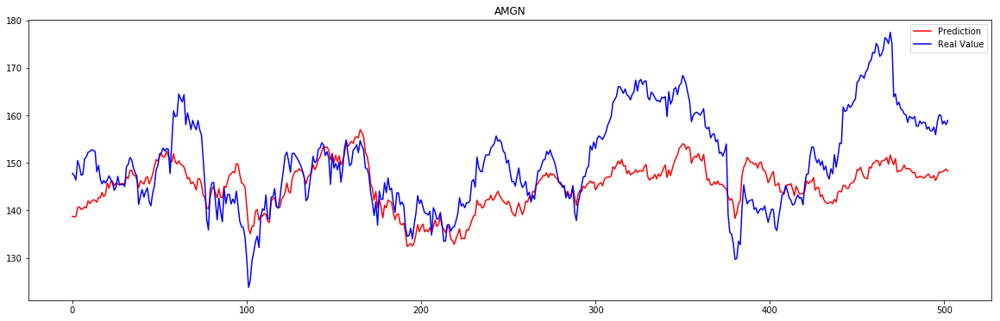

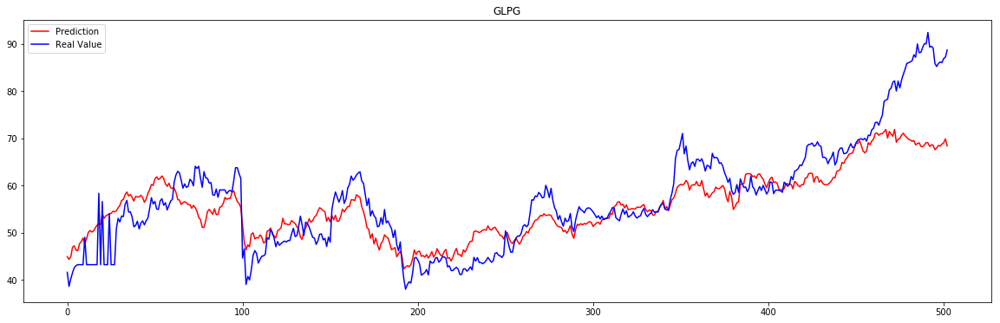

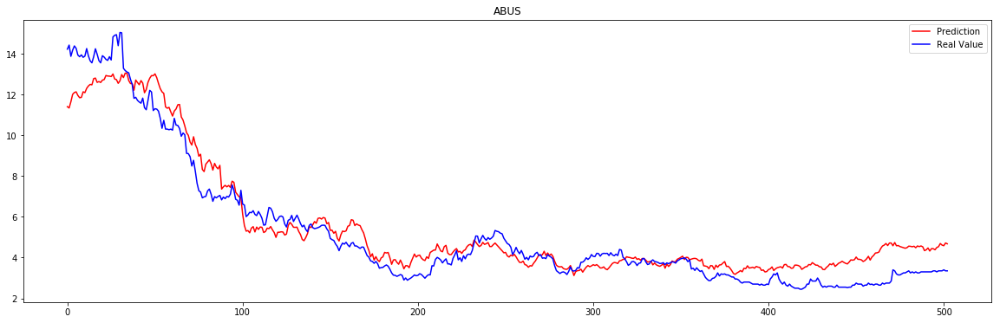

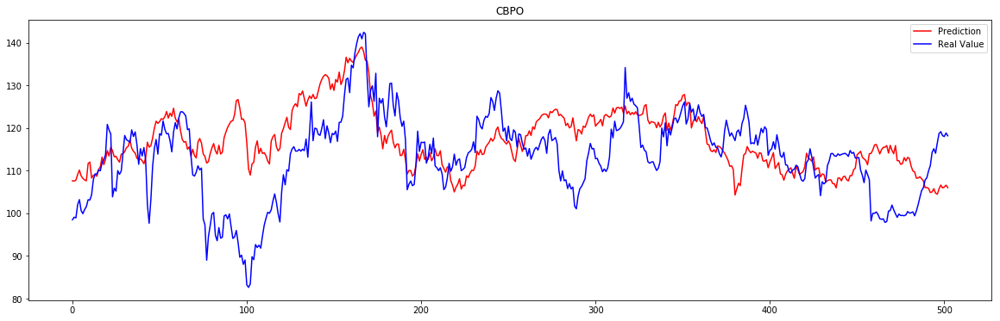

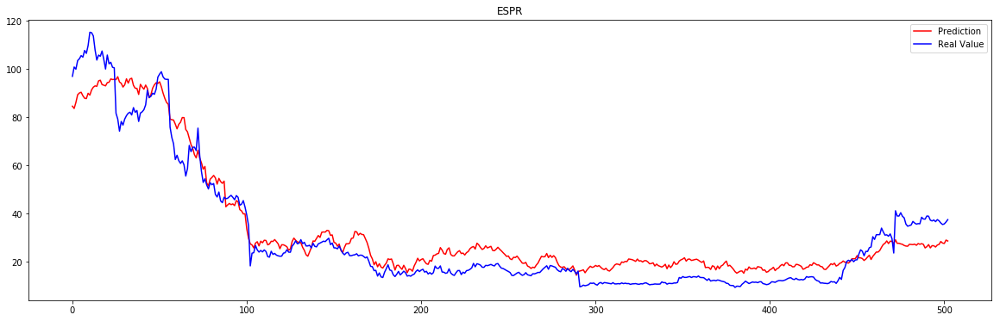

...

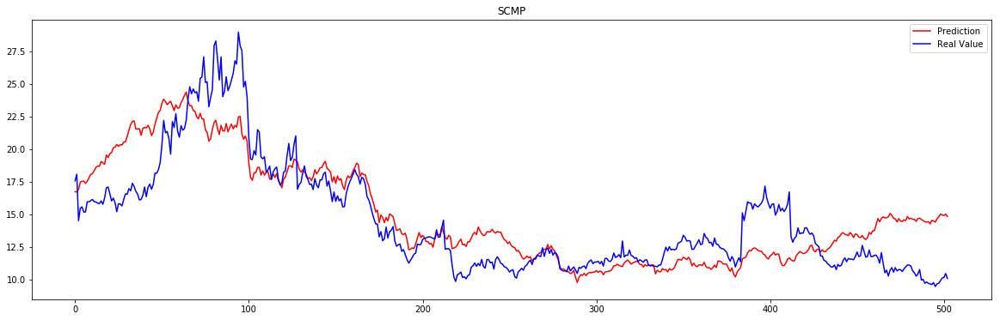

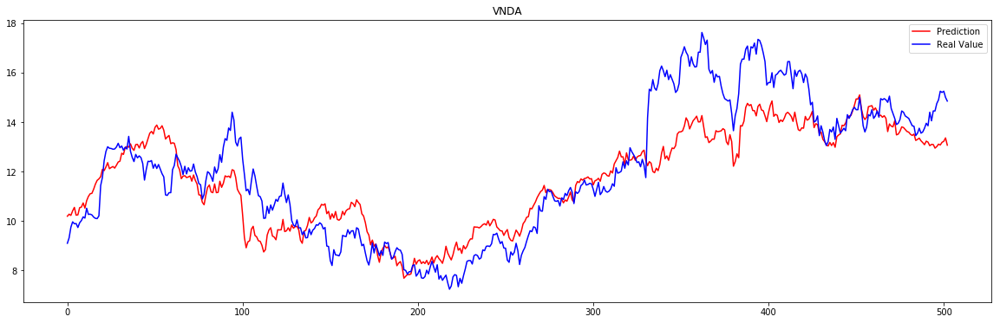

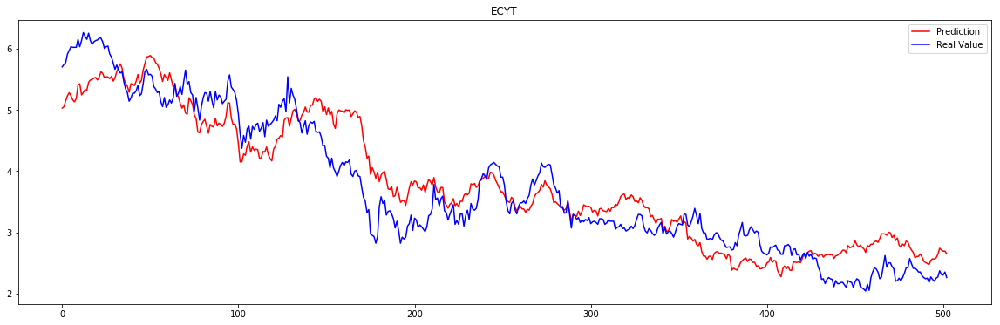

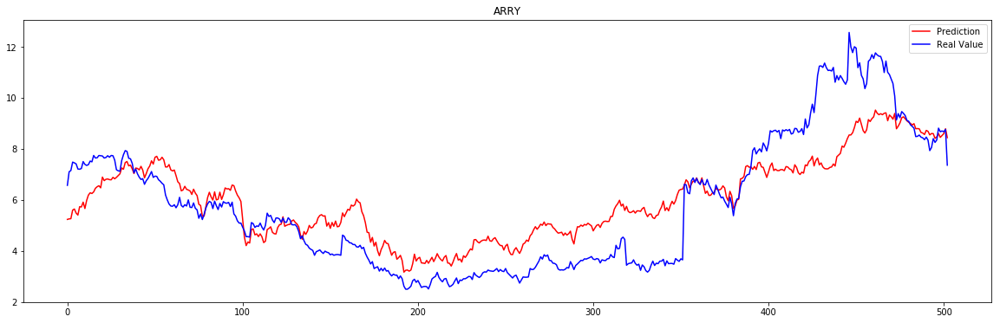

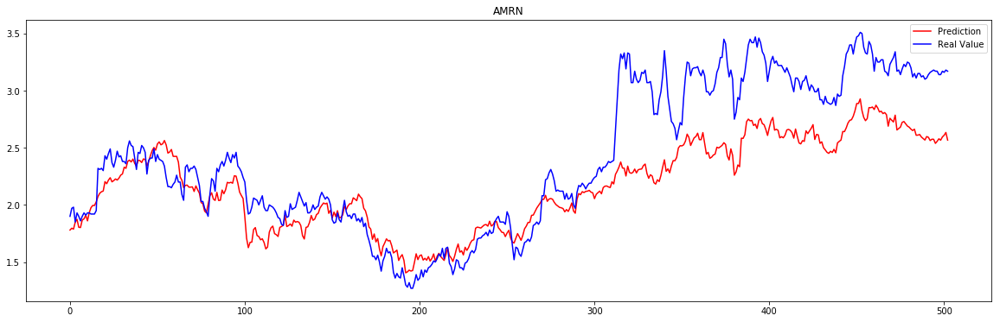

In [66]:
for j in unnormalized_p.keys():
    plt.figure()
    plt.plot(unnormalized_p[j][1] ,'r', label = "Prediction")
    plt.hold
    plt.plot(train_df[j] ,'b',label = "Real Value")
    plt.title(unnormalized_p[j][0])
    plt.legend()
    plt.show;

In [67]:
diff = abs(p - batch_x)
L2 = np.sqrt(np.multiply(diff,diff))

# 5) Our average error (on a train)

In [68]:
print('average error in our case = ',np.mean(L2))

average error in our case =  0.0832110867238


In [71]:
random = np.random.uniform(0,1,(len_train,503))

In [72]:
diff_random = abs(batch_x - random)
L2_random = np.sqrt(np.multiply(diff_random,diff_random))
print('average error in a random case = ',np.mean(L2_random))

average error in a random case =  0.328271016328


# 6) Plot the commonals

In [73]:
def plot_commonals_valid(p, batch_x, train_dfn, all_dataset_ticker):
    sorted_by_value = []
    
    diff = abs(p - batch_x)
    L2 = np.sqrt(np.multiply(diff,diff))
    
    for i in range(len(p)):
        sorted_by_value.append((np.mean(L2[i]),i))

    objects =  []
    performance = sorted(sorted_by_value)

    for i in performance:
        ticker, index = find_ticker_batch(batch_x[i[1]], train_dfn, all_dataset_ticker)
        objects.append(ticker)


    y_pos = np.arange(len(objects))
    plotable_performance = [i[0] for i in performance]

    
    plt.figure()
    plt.bar(y_pos, plotable_performance, align='center', alpha=0.5)
    plt.xticks(y_pos, objects)
    plt.ylabel('Score')
    plt.title('Commonals')

    plt.show();

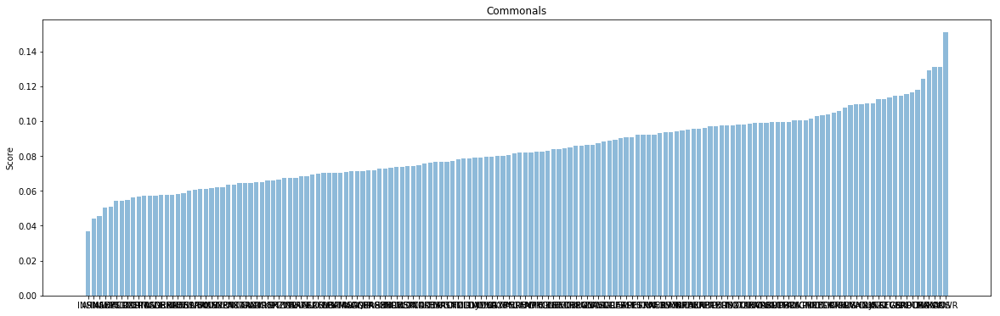

In [74]:
plot_commonals_valid(p, batch_x, train_dfn, all_dataset_ticker)

# 7) A function to retrieve the most/least commonals

In [75]:
# batch_x is the array of initial rate of returns
# p is the array of predictions
# S is the number of "most commonals"
# Take the 10 most commonals, plus the S - 10 least commonals

def return_commonals_valid(S,p,batch_x): 
    sorted_by_value = []
    
    diff = abs(p - batch_x)
    L2 = np.sqrt(np.multiply(diff,diff))
    
    for i in range(len(p)):
        sorted_by_value.append((np.mean(L2[i]),i))
    
    performance = sorted(sorted_by_value)

    objects= []
    for i in performance:
        ticker, index = find_ticker_batch(batch_x[i[1]], train_dfn, all_dataset_ticker)
        objects.append(ticker)
    
    list_commonals =  []
    
    for i in range(10):
        list_commonals.append([objects[i],batch_x[performance[i][1]]])
    
    for i in range(S-10):
        list_commonals.append([objects[-i],batch_x[performance[-i][1]]])
    
    return(list_commonals)

In [76]:
# Training Parameters
S = 65

stock_list = [return_commonals_valid(S, p, batch_x)[i][1] for i in range(S)]
ticker_list = [return_commonals_valid(S, p, batch_x)[i][0] for i in range(S)]



len_list = len(stock_list)
stock_list_unnorm = []
for j in range(len_list):
    _, index = find_ticker_batch(stock_list[j], train_dfn, all_dataset_ticker)

    minimum = np.min(train_df[index])
    maximum = np.max(train_df[index])
    stock_list_unnorm.append(stock_list[j] * (maximum - minimum) + minimum)

    
stock_arr = np.array(stock_list_unnorm).transpose()

# 8) Initialize the calibrating with our commonals

In [111]:
#train_setData_n, train_setData, list_tickers_train

learning_rate_calib = 0.0004
num_steps_calib = 8000
batch_size_calib = 25
lambd_calib = 0.2
val_dropout_calib = 0.88

display_step_calib = 1000

cross_len_calib = 1


# Network Parameters 

num_input_calib = S
n_hidden_calib = 5  # bottleneck layer
num_output_calib = S

In [112]:
# Output : benchmark of the IBB
bound_train = int(np.floor(len(rate2)*0.75))
y_valid = rate2['Adj Close'][:bound_train]
y_valid = y_valid.tolist()


In [113]:
stock2 = logRateOfReturnWeekly(pd.DataFrame(stock_arr),shift_calib)

In [114]:
stock_list_2 = []
for i in stock2.columns:
    stock_list_2.append(list(stock2[i]))
stock_list_2 = np.array(stock_list_2).transpose()

# 9) Launch the training of our calibrating

In [115]:
#def train_function(train_setDn, test_setDn):
with tf.Graph().as_default():
    with tf.variable_scope("calibration_phase"):
        
        # Placeholders
        x = tf.placeholder("float", [None, S])
        label = tf.placeholder("float", [None,1])
        
        phase_train = tf.placeholder(tf.bool)
        keep_prob = tf.placeholder(tf.float32) #gateway for dropout

        # Extract the latent information (logits from the bottleneck layer)
        hidden, W_e = layer1_calib(x, S, n_hidden_calib, phase_train)

        # Extract the outputs of the autoencoder
        output, W_d = layer2_calib(hidden, S, n_hidden_calib, phase_train)
        
        rr_tot = np.dot(output, x)
            
        cost = loss(mse(rr_tot, label), regularizer(W_e, W_d), lambd_calib, num_input_calib, batch_size_calib)

        train_op = training(cost, learning_rate_calib)

        eval_op, val_summary_op = evaluate(rr_tot, label)

        # Merge all the summaries - variables, training - into a single operation
        summary_op = tf.summary.merge_all()

        # Save the trained model for later use (testing)
        saver = tf.train.Saver()        

        # Create the session list that will be runned for training
        
        total_loss = np.zeros(num_steps_calib)
        
        
        start_time = time()
        
        session = tf.Session()
        
        init_op = tf.global_variables_initializer()
        session.run(init_op)
        
        summary_writer = tf.summary.FileWriter(logs_path, graph=tf.get_default_graph())
        
        for i in range(1, num_steps_calib + 1):
            
            
            total_batch = int(len(stock_list_2) / batch_size_calib)

            for j in range(total_batch):
                mini_batch_x, mini_batch_y = next_batch(batch_size_calib, stock_list_2[:bound_train], y_valid)


            _, l, summary = session.run([train_op, cost, summary_op], 
                            feed_dict={x: mini_batch_x , label: mini_batch_y.reshape((batch_size_calib,1)), phase_train: True, keep_prob: val_dropout_calib})
            
            
            total_loss[i-1] = l
            
            summary_writer.add_summary(summary, i)
            
            if i % display_step == 0:

                    print('Step %i : Minibatch Loss: %f' % (i, l))
                    curr_time = time()
                    elapsed_time = curr_time-start_time
                    print('Estimated remaining time = ', elapsed_time / i * (num_steps_calib-i),'s\n')
                    
        
        #mini_batch_x, mini_batch_y = next_batch(batch_size, stock_list_2, y)
        
        lll=[]
        for i in y_valid:
            lll.append([i])
        mini_batch_x, mini_batch_y = stock_list_2, lll
        
        #p_calib = session.run([output] , feed_dict={x: mini_batch_x , label: mini_batch_y.reshape((batch_size,1)), phase_train: True, keep_prob: 1})
        p_calib = session.run(output , feed_dict={x: mini_batch_x , label: mini_batch_y, phase_train: False, keep_prob: 1})
        



Step 100 : Minibatch Loss: 3.005377
Estimated remaining time =  272.4906921386719 s

Step 200 : Minibatch Loss: 2.577383
Estimated remaining time =  180.3375277519226 s

Step 300 : Minibatch Loss: 2.223635
Estimated remaining time =  150.0102302233378 s

Step 400 : Minibatch Loss: 1.926207
Estimated remaining time =  131.05660486221313 s

Step 500 : Minibatch Loss: 1.673252
Estimated remaining time =  118.37831497192384 s

Step 600 : Minibatch Loss: 1.456208
Estimated remaining time =  113.11339314778645 s

Step 700 : Minibatch Loss: 1.268840
Estimated remaining time =  107.65283952440534 s

Step 800 : Minibatch Loss: 1.106401
Estimated remaining time =  101.46419477462769 s

Step 900 : Minibatch Loss: 0.964908
Estimated remaining time =  96.45712844530742 s

Step 1000 : Minibatch Loss: 0.841427
Estimated remaining time =  95.21196722984314 s

Step 1100 : Minibatch Loss: 0.733381
Estimated remaining time =  93.30718608336015 s

Step 1200 : Minibatch Loss: 0.638825
Estimated remaining t

# 10) Retrieve results from calibration and compare them to the benchmark

In [116]:
calibration = []
for i in range(len(p_calib)):
    mini_batch_x_keep = mini_batch_x[i]
    p_keep = p_calib[i]
    product = np.sum(np.dot(p_keep,mini_batch_x_keep))
    calibration.append(product)

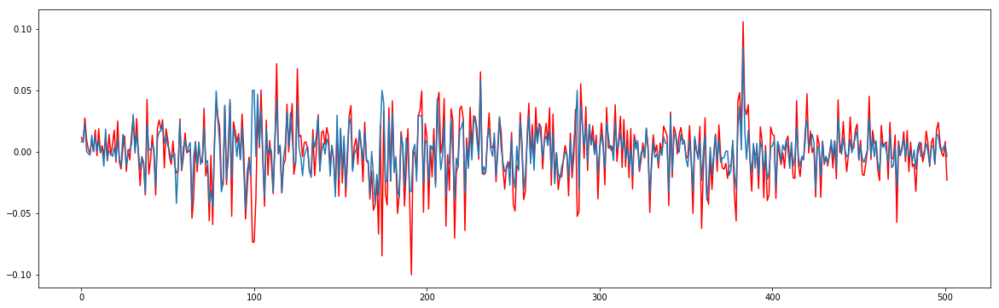

In [117]:
plt.plot(calibration[:bound_train], 'r')
plt.plot(mini_batch_y)
plt.show();

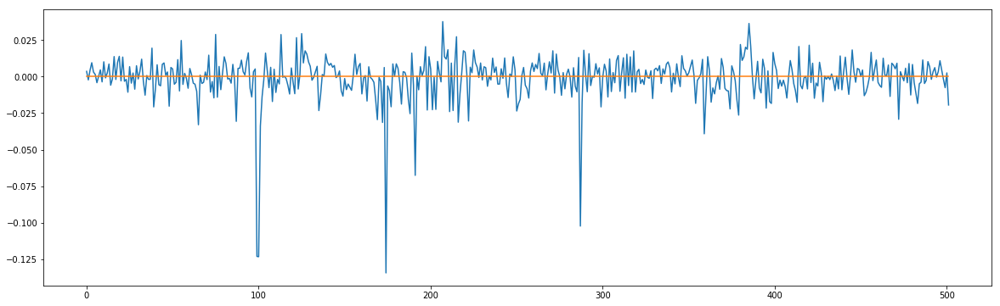

In [118]:
batch_size_verif = len(y_valid)
mne = [0]*batch_size_verif


plt.plot(np.array(calibration[:bound_train])-np.array(y_valid[:bound_train]))
plt.plot(mne)
plt.show();

In [119]:
avg_rateOfReturn_calib = np.array(calibration).mean()

In [120]:
np.array(mini_batch_y).mean()

0.00059865027272134339

In [121]:
print(rate['Adj Close'].mean())
print(rate2['Adj Close'].mean())

-7.245310344628762e-05
0.000558056820046499


# 11) Final results with the training

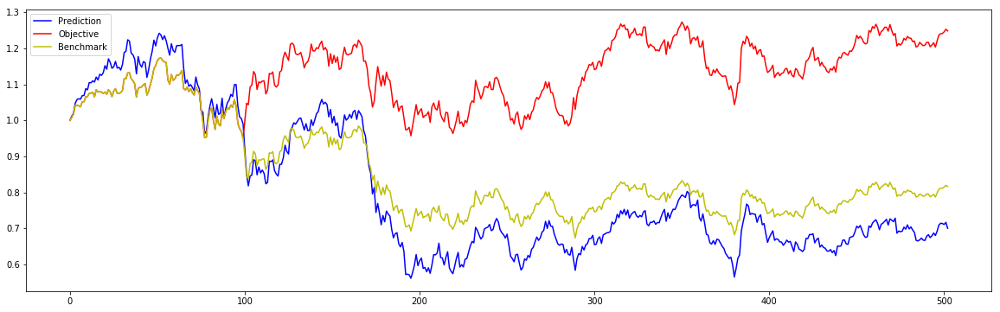

In [122]:
result_prices = reconstruct(calibration[:bound_train])
expected_prices = reconstruct(y_valid)
reconstruct_real_prices = reconstruct(rate['Adj Close'][:bound_train])
plt.plot(result_prices,'b', label = "Prediction")
plt.plot(expected_prices,'r', label = "Objective")
plt.plot(reconstruct_real_prices,'y', label = "Benchmark")
plt.legend()
plt.show();

# 12) We retrieve the list of most/least commonals and the weights associated